In [26]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import os
import numpy as np
import skimage.io
from operator import *
import pandas as pd

import cv2
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
import skimage
import skimage.feature
import os
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
import xgboost
from functools import partial
import pyproj
from shapely.ops import transform
from skimage import color
from skimage import io
from collections import Counter
import xgboost

import matplotlib.pyplot as plt
import os
from scipy.misc import imresize
from PIL import Image, ImageDraw
tiles_folder = 'satellite_maps/grodno_maps_full/tiles/'

slist = sorted(os.listdir(tiles_folder))

min_i = int(slist[0].split('_')[2])
max_i = int(slist[-1].split('_')[2])

min_j = int(slist[0].split('_')[1])
max_j = int(slist[-1].split('_')[1])
# print(min_i, max_i, min_j, max_j)
shape_i = (max_i-min_i+1) * 256
shape_j = (max_j-min_j+1) * 256

move_left=-0.00005
move_up=0.0001

# move_left=0
# move_up=0

left_lon = 23.71673583984375+move_left
right_lon = 24.00100708007812+move_left
top_lat = 53.76657242801669+move_up
bottom_lat = 53.60554409539466+move_up

df = gpd.read_file('geojson/grodno_buildings_full_18.geojson')
df.shape

def plot_building(building):
    gpd.geodataframe.GeoDataFrame([building]).plot()

def get_building_by_coords(lat, lon):
    p = Point(lon, lat)

    assert(p.x>left_lon)
    assert(p.x<right_lon)
    
    assert(p.y>bottom_lat)
    assert(p.y<top_lat)
    
    building_index = df.geometry.centroid.distance(p).sort_values().index[0]
    return df.ix[building_index]

# plot_building(get_building_by_coords(53.684476, 23.852337))

def get_tile_coords(lat, lon):
    i = int(np.floor(np.interp(lat, [bottom_lat, top_lat], [max_i+1, min_i])))
    j = int(np.floor(np.interp(lon, [left_lon, right_lon], [min_j, max_j+1])))
#     print(j)

    assert(i >= min_i and i <= max_i)
    assert(j >= min_j and j <= max_j)
    return (i, j)

# tcoords = get_tile_coords(53.686032, 23.855658)

def get_tiles_region(building):
    bounds = building.geometry.bounds
    tiles_coords = []
    tiles_coords.append(get_tile_coords(bounds[1], bounds[0]))
    tiles_coords.append(get_tile_coords(bounds[1], bounds[2]))
    tiles_coords.append(get_tile_coords(bounds[3], bounds[0]))
    tiles_coords.append(get_tile_coords(bounds[3], bounds[2]))
    i1 = min(map(itemgetter(0), tiles_coords))
    i2 = max(map(itemgetter(0), tiles_coords))
    j1 = min(map(itemgetter(1), tiles_coords))
    j2 = max(map(itemgetter(1), tiles_coords))
    return (i1, i2, j1, j2)

# plt.imshow(get_tiles_region_image(*get_tiles_region(b)))

def get_building_image(building):
    i1, i2, j1, j2 = get_tiles_region(building)
    img = get_tiles_region_image(i1, i2, j1, j2)
#     print(i1,i2,j1,j2)
    t_left_lon = np.interp(j1, [min_j, max_j+1], [left_lon, right_lon])
    t_right_lon = np.interp(j2+1, [min_j, max_j+1], [left_lon, right_lon])
    t_top_lat = np.interp(i1, [min_i, max_i+1], [top_lat, bottom_lat])
    t_bottom_lat = np.interp(i2+1, [min_i, max_i+1], [top_lat, bottom_lat])
    
    bounds = building.geometry.bounds
    
    im_i1 = round(np.interp(bounds[3], [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0]))
    im_i2 = round(np.interp(bounds[1], [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0]))
    im_j1 = round(np.interp(bounds[0], [t_left_lon, t_right_lon], [0, img.shape[1]+1]))
    im_j2 = round(np.interp(bounds[2], [t_left_lon, t_right_lon], [0, img.shape[1]+1]))
    
    return img[im_i1:im_i2+1,im_j1:im_j2+1,:]

def get_building_image_by_id(id):
    building = df.ix[id]

    assert(id == building.id-1)
    return get_building_image(building)

def get_building_area(building):
    project = partial(
        pyproj.transform,
        pyproj.Proj(init='EPSG:4326'),
        pyproj.Proj(init='EPSG:32633'))
    figure = transform(project, building.geometry)
    return figure.area

def get_tiles_region_image(i1, i2, j1, j2):
    tile_size = 256
    res = np.zeros(((i2-i1+1) * tile_size, (j2-j1+1) * tile_size, 3),dtype='uint8')
    for i in range(i1, i2+1):
        for j in range(j1, j2+1):
            fname = tiles_folder + 'gs_%d_%d_18.jpg' % (j, i)
            img = skimage.io.imread(fname)
            res[(i-i1) * tile_size:(i-i1+1) * tile_size, (j-j1) * tile_size:(j-j1+1) * tile_size]=img
    return res

def coords_to_array(coords):
    return [[c[1], c[0]] for c in coords]

def get_building_image_outlined(building, sh, color, fill=False, outline=False):
    i1, i2, j1, j2 = get_tiles_region(building)
    i1=i1-1
    i2=i2+1
    j1=j1-1
    j2=j2+1
    img = get_tiles_region_image(i1, i2, j1, j2)
#     print(i1,i2,j1,j2)
    t_left_lon = np.interp(j1, [min_j, max_j+1], [left_lon, right_lon])
    t_right_lon = np.interp(j2+1, [min_j, max_j+1], [left_lon, right_lon])
    t_top_lat = np.interp(i1, [min_i, max_i+1], [top_lat, bottom_lat])
    t_bottom_lat = np.interp(i2+1, [min_i, max_i+1], [top_lat, bottom_lat])
    
    bounds = building.geometry.bounds
    
    bci = building.geometry.centroid.y#(bounds[3]+bounds[1])/2.0
    bcj = building.geometry.centroid.x#(bounds[0]+bounds[2])/2.0
    
    bleni = 0.0005
    blenj = 0.0008
    
    bounds=[bcj-blenj,bci-bleni,bcj+blenj,bci+bleni]
    
    add_right = 60
    add_down = 20
    
    
    
    im_i1 = round(np.interp(bounds[3], [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0]))
    im_i2 = round(np.interp(bounds[1], [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0]))+add_down
    im_j1 = round(np.interp(bounds[0], [t_left_lon, t_right_lon], [0, img.shape[1]+1]))
    im_j2 = round(np.interp(bounds[2], [t_left_lon, t_right_lon], [0, img.shape[1]+1]))+add_right

    min_x = int((bounds[0] - left_lon)/(right_lon - left_lon) * shape_j)
    max_x = int((bounds[2] - left_lon)/(right_lon - left_lon) * shape_j)
    min_y = int((bounds[3] - top_lat)/(bottom_lat - top_lat) * shape_i)
    max_y = int((bounds[1] - top_lat)/(bottom_lat - top_lat) * shape_i)
    
    move_left_1st=-0.0001
    move_left_last=-0.00031
#     left_shift = [move_left_1st - i * ((move_left_1st - move_left_last)/12) for i in range(0,16)]
    left_shift = [- i * ((move_left_1st - move_left_last)/12) for i in range(0,17)]
    move_up_1st=0.00005
    move_up_last=0.00009
#     up_shift = [move_up_1st - i * ((move_up_1st - move_up_last)/12) for i in range(0,16)]
    up_shift = [-i * ((move_up_1st - move_up_last)/12) for i in range(0,17)]

    
    n_shifts = sh
    shift_right = left_shift[n_shifts]
    shift_down = up_shift[n_shifts]
    
    tmp_img = img[im_i1:im_i2+1,im_j1:im_j2+1,:].copy()
    tim = Image.fromarray(tmp_img)
    drw = ImageDraw.Draw(tim, 'RGBA')
    
    if outline:
        poly = coords_to_array(building.geometry.exterior.coords)
        poly_coords = []
        
        l_w = 5
        
        for t in poly:
            cur_i = round(np.interp(t[0] - shift_down, [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0])) - im_i1
            cur_j = round(np.interp(t[1] - shift_right, [t_left_lon, t_right_lon], [0, img.shape[1]+1])) - im_j1
            poly_coords.append((cur_j, cur_i))
            
        drw.line(poly_coords, fill=color, width=l_w)
        
        for pp in building.geometry.interiors:
            poly = coords_to_array(pp.coords)
            poly_coords = []

            for t in poly:
                cur_i = round(np.interp(t[0] - shift_down, [t_bottom_lat, t_top_lat], [img.shape[0]+1, 0])) - im_i1
                cur_j = round(np.interp(t[1] - shift_right, [t_left_lon, t_right_lon], [0, img.shape[1]+1])) - im_j1
                poly_coords.append((cur_j, cur_i))

            drw.line(poly_coords, fill=color, width=l_w)


    
    if fill:
        for i in range(tmp_img.shape[0]):
            for j in range(tmp_img.shape[1]):
                pnt_lat = top_lat + (min_y+i+0.0) / shape_i * (bottom_lat - top_lat)+shift_down
                pnt_lon = left_lon + (min_x+j+0.0) / shape_j * (right_lon - left_lon)+shift_right
                if Point(pnt_lon,pnt_lat).within(building.geometry):
                    drw.point((j,i), color)
#                 drw.polygon([(j, i), (j, i)], (255, 0, 0, 125))
#                 s=1-tmp_img[i, j, :]
#                 tmp_img[i, j, :] = [255,0,0]-(s*0.2)
#                 tmp_img[i, j, :] = np.minimum(tmp_img[i,j,:], 1)
#                 tmp_img[i, j, :] = np.maximum(tmp_img[i,j,:], 0)
                
#                 tmp_img[i, j, 0] = 
    #         print(pnt_lat, pnt_lon)
#     plt.imshow(tim)
#     plt.show()
    
    return np.array(tim)#img[im_i1:im_i2+1,im_j1:im_j2+1,:]

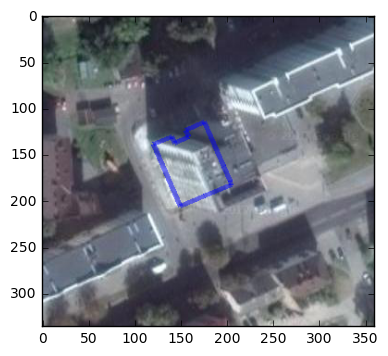

In [27]:
# img = Image.new('RGB', (100, 100))
img = get_building_image_outlined(df.ix[860], 4, color=(0, 0, 255, 125), outline=True)
plt.imshow(img)
# img = Image.fromarray(img)

In [241]:
drw.polygon

NameError: name 'drw' is not defined

In [246]:
drw = ImageDraw.Draw(img, 'RGBA')
drw.polygon([(50, 0), (100, 100), (0, 100)], (255, 0, 0, 125))
drw.polygon([(50,100), (100, 0), (0, 0)], (0, 255, 0, 125))
drw.point()

TypeError: point() missing 1 required positional argument: 'xy'

In [284]:
img = get_building_image_outlined(df.ix[855], 4)
# plt.imshow(img)

TypeError: get_building_image_outlined() missing 1 required positional argument: 'color'

In [3]:
bad_roofs = {27:3, 42:0, 44:2, 589:5, 596:2, 597:2, 607:3, 610:3, 620:4, 620:5, 2394:1, 2297:2, 855:4}
good_roofs = {1114:5, 877:4, 9:5, 41:4, 46:3, 683:4, 687:7, 835:8, 841:8, 859:3}

# 3930:16

In [8]:
roofs_inds = list(bad_roofs.keys())+list(good_roofs.keys())
np.random.shuffle(roofs_inds)

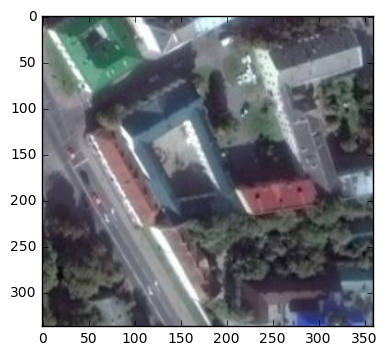

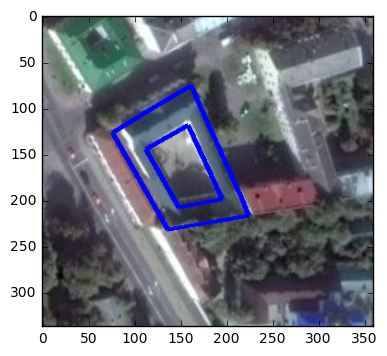

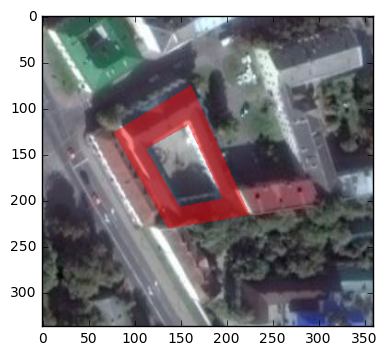

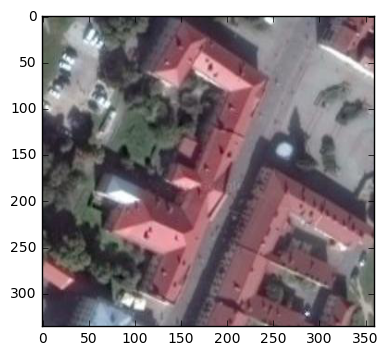

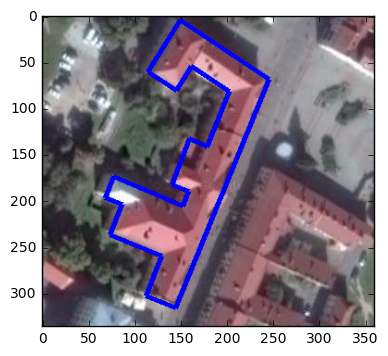

...

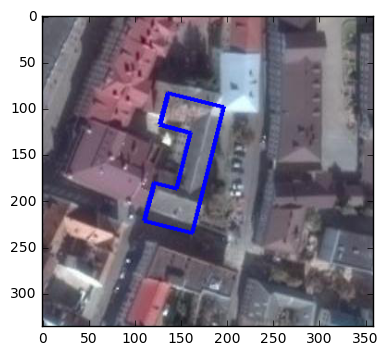

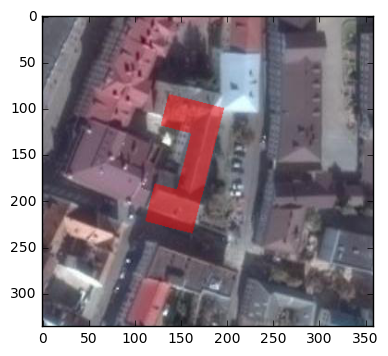

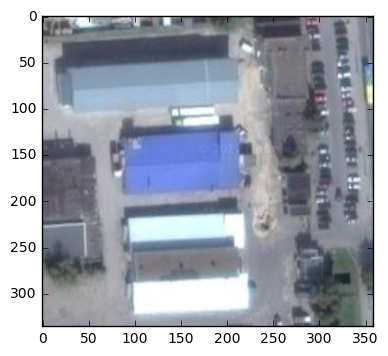

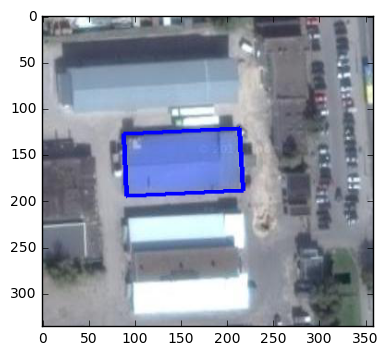

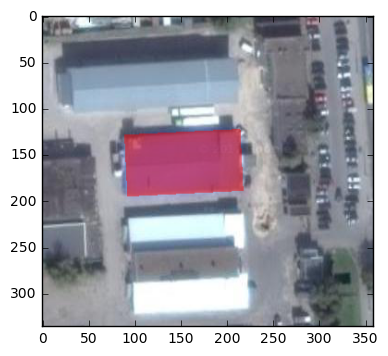

In [28]:
imid = 0
for rind in roofs_inds:
    v = -1
    bad = False
    if rind in bad_roofs:
        v = bad_roofs[rind]
        bad = True
    else:
        v = good_roofs[rind]
    
    col = (255, 0, 0, 125)
    if not bad:
        col = (0, 255, 0, 125)
    
    img = get_building_image_outlined(df.ix[rind], v, (0, 0, 255))
    plt.imshow(img)
    plt.show()
    skimage.io.imsave('data/output/anim/%03d.png' % imid, img); imid += 1
    
    img = get_building_image_outlined(df.ix[rind], v, (0, 0, 255), outline=True)
    plt.imshow(img)
    plt.show()
    skimage.io.imsave('data/output/anim/%03d.png' % imid, img); imid += 1
    
    img = get_building_image_outlined(df.ix[rind], v, col, fill=True)
    plt.imshow(img)
    plt.show()
    skimage.io.imsave('data/output/anim/%03d.png' % imid, img); imid += 1

In [263]:
plt.show()
img
plt.show()

610


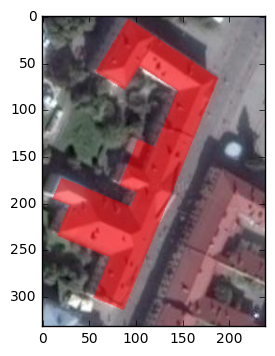

44


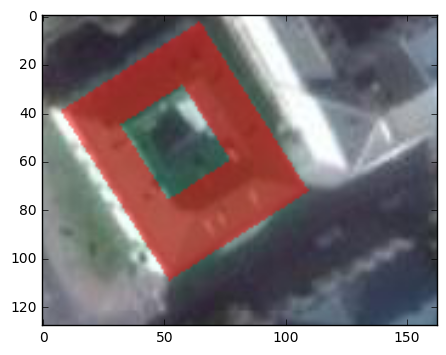

42


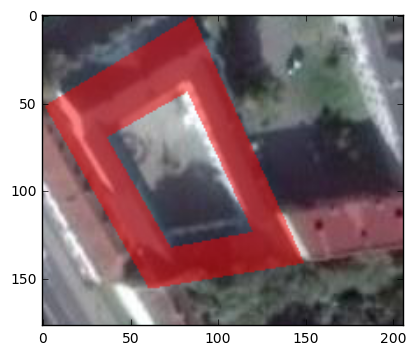

620


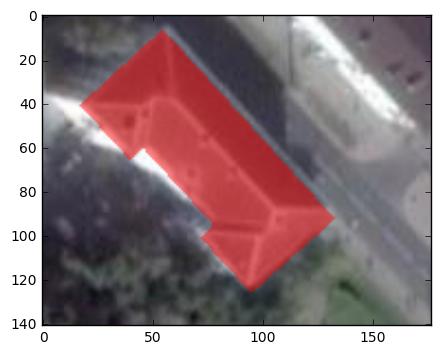

589


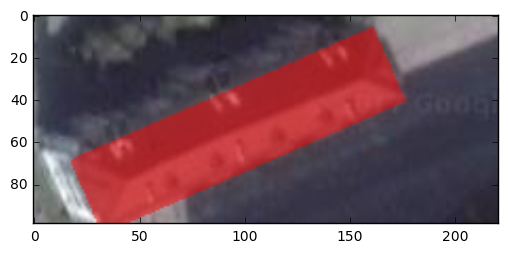

561


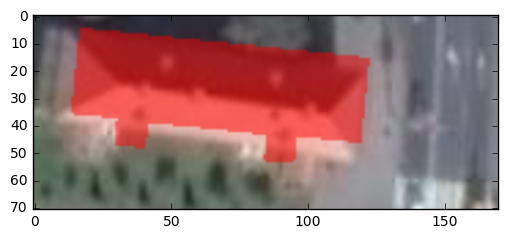

596


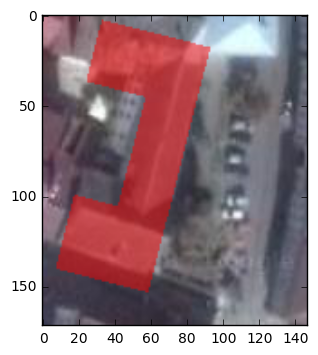

597


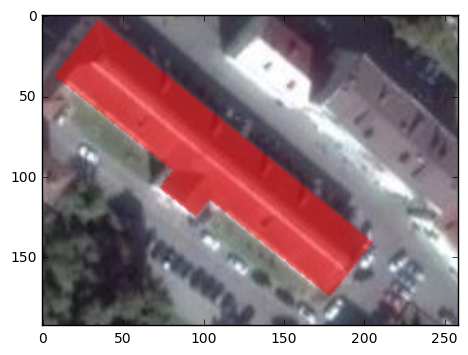

855


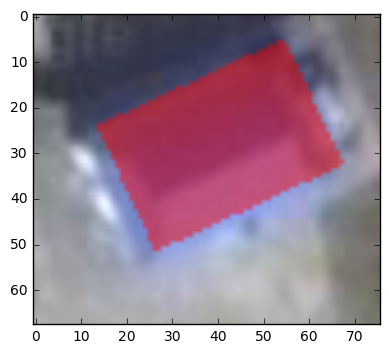

2297


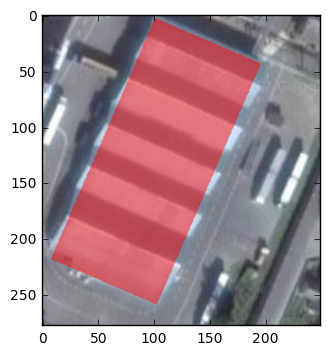

2394


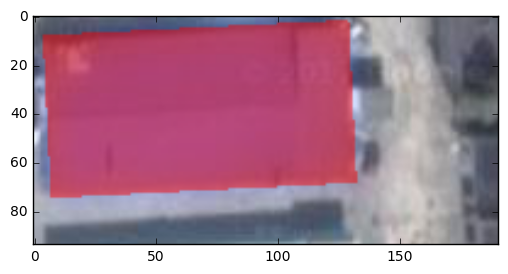

27


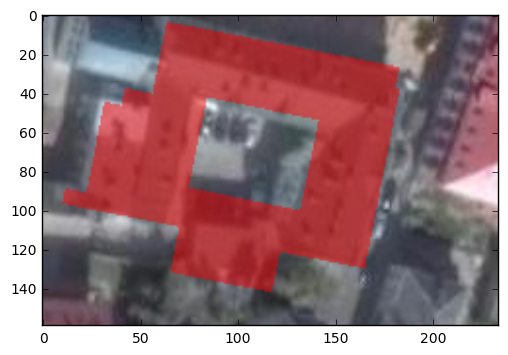

607


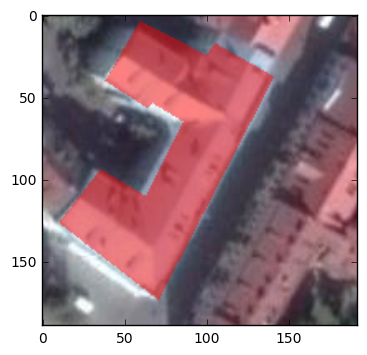

In [280]:
for k in bad_roofs:
    print(k)
    v = bad_roofs[k]
    img = get_building_image_outlined(df.ix[k], v, (255, 0, 0, 125)
    plt.imshow(img)
    plt.show()

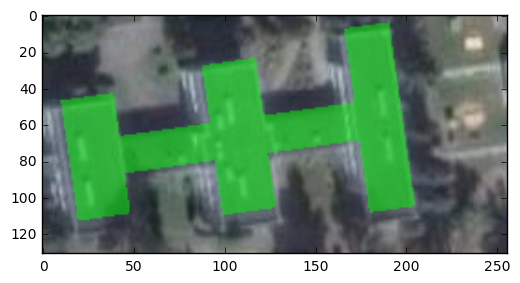

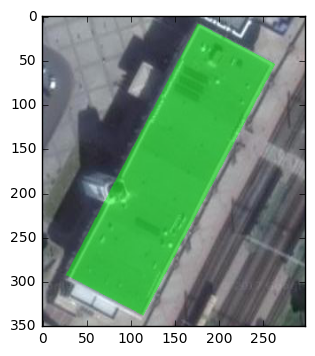

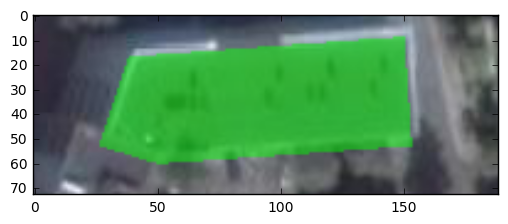

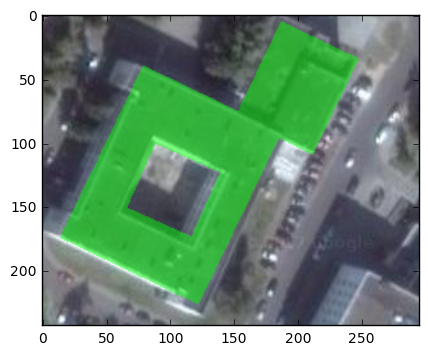

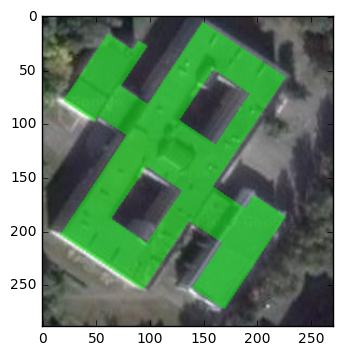

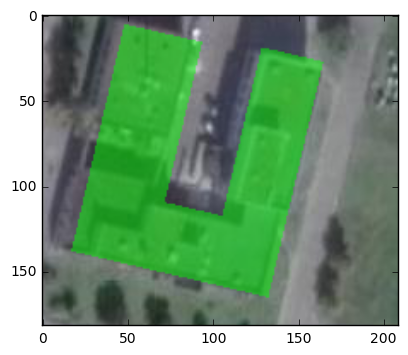

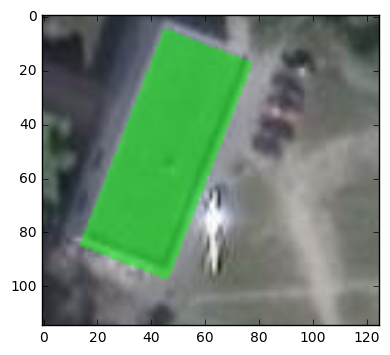

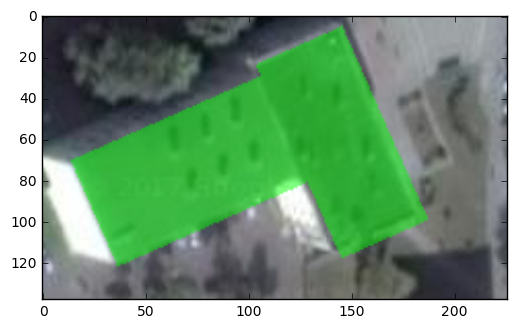

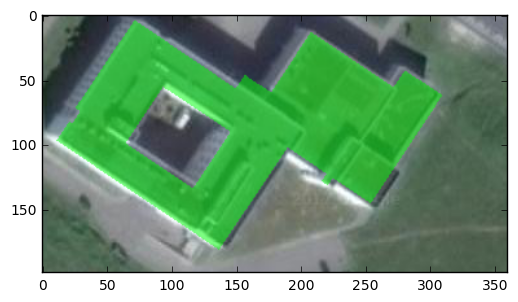

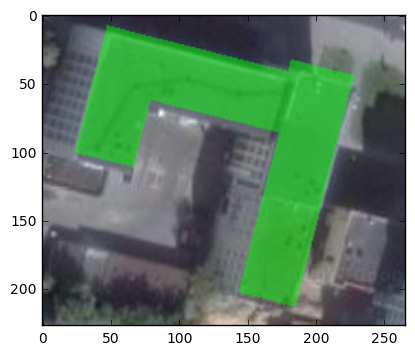

In [282]:
for k in good_roofs:
    v = good_roofs[k]
    img = get_building_image_outlined(df.ix[k], v, (0, 255, 0, 125))
    plt.imshow(img)
    plt.show()

In [3]:
bad_roofs = os.listdir('./classifying/new_set/bad/')
good_roofs = os.listdir('./classifying/new_set/good/')

In [87]:
good_roofs[:20]

['04134.bmp',
 '03882.bmp',
 '03857.bmp',
 '02760.bmp',
 '03930.bmp',
 '02185.bmp',
 '03888.bmp',
 '03871.bmp',
 '01263.bmp',
 '03887.bmp',
 '02539.bmp',
 '02393.bmp',
 '00817.bmp',
 '03825.bmp',
 '01114.bmp',
 '03823.bmp',
 '00043.bmp',
 '01874.bmp',
 '01940.bmp',
 '02583.bmp']

03930.bmp


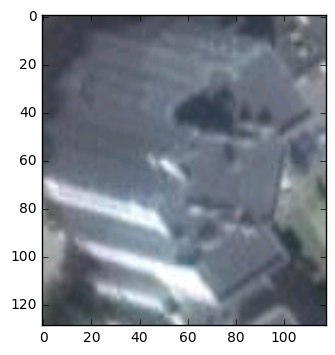

In [105]:
for fname in ['03930.bmp']:#good_roofs[:10]:
    print(fname)
    img = plt.imread('classifying/new_set/good/' + fname)
    plt.imshow(img)
    plt.show()

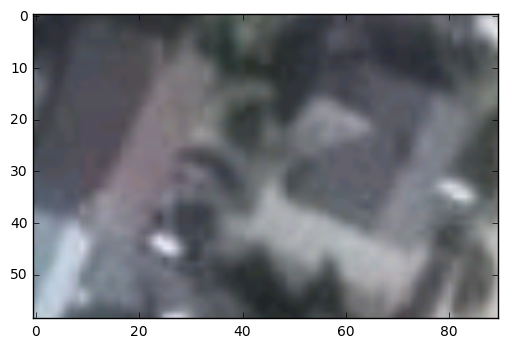

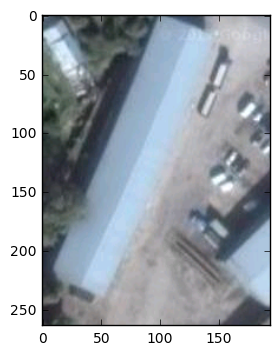

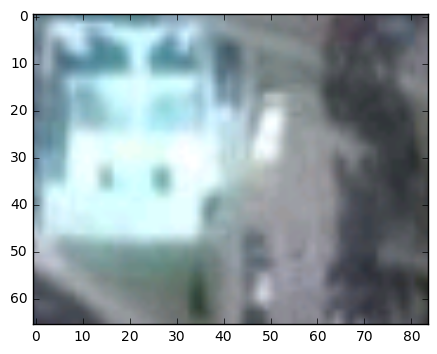

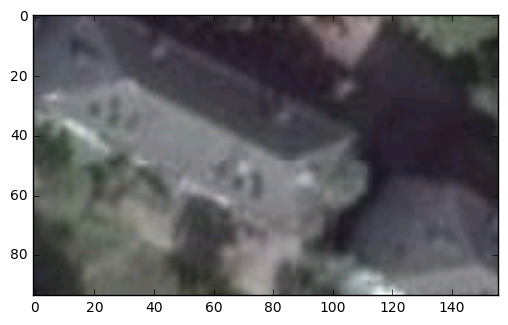

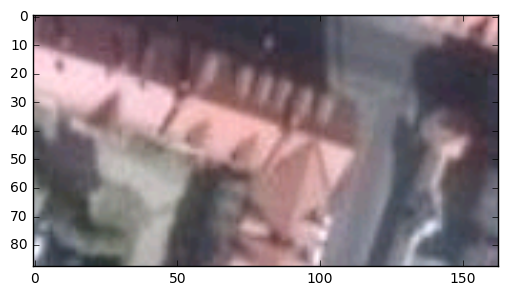

...

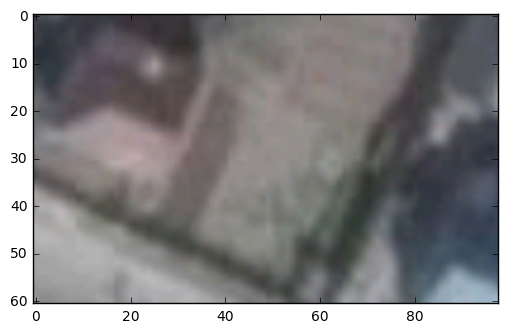

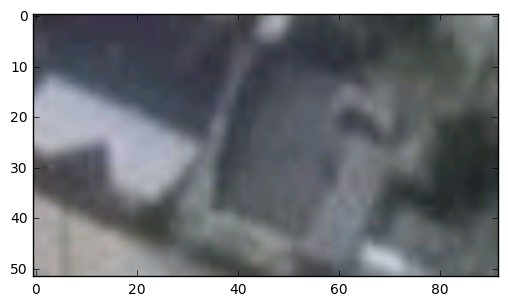

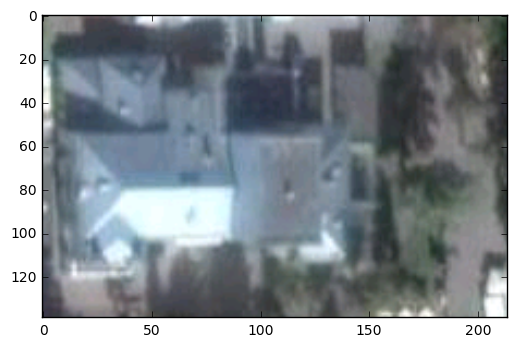

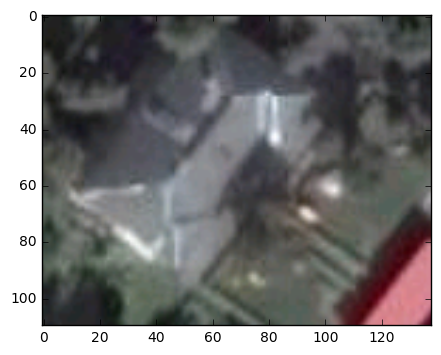

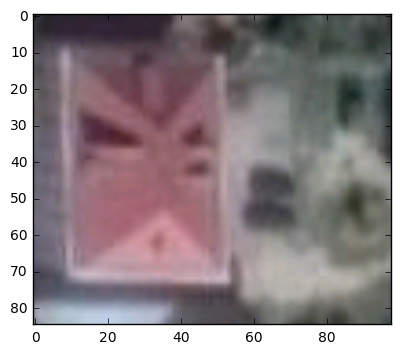

In [15]:
for fname in bad_roofs[:15]:
    img = plt.imread('classifying/new_set/bad/' + fname)
#     img = imresize(img, (64,64))
    plt.imshow(img)
    plt.show()